## Laboratorium 8


## Detekcja obiektów za pomocą Faster-RCNN

### Wprowadzenie

Celem tej listy jest praktyczne zapoznanie się z działaniem dwuetapowych modeli do detekcji obiektów na przykładzie Faster R-CNN. Skorzystamy z gotowej implementacji modelu z pakietu [`torchvision`](https://github.com/pytorch/vision/blob/main/torchvision/models/detection/faster_rcnn.py). Jeżeli masz inny ulubiony model działający na podobnej zasadzie, możesz z niego skorzystać zamiast podanego. Podobnie implementacja - jeśli masz swoją ulubioną bibliotekę np. Detectron2, MMDetection, możesz z niej skorzystać.

W zadaniu wykorzystany zostanie zbiór danych [_Chess Pieces Dataset_](https://public.roboflow.com/object-detection/chess-full) (autorstwa Roboflow, domena publiczna), ZIP z obrazami i anotacjami powinien być dołączony do instrukcji.

Podczas realizacji tej listy większy nacisk położony zostanie na inferencję z użyciem Faster R-CNN niż na uczenie (które przeprowadzisz raz\*). Kluczowe komponenty w tej architekturze (RPN i RoIHeads) można konfigurować bez ponownego uczenia, dlatego badania skupią się na ich strojeniu. Aby zrozumieć działanie modelu, konieczne będzie spojrzenie w jego głąb, włącznie z częściowym wykonaniem. W tym celu warto mieć na podorędziu kod źródłowy, w szczególności implementacje następujących klas:
* `FasterRCNN`: https://github.com/pytorch/vision/blob/main/torchvision/models/detection/faster_rcnn.py
* `GeneralizedRCNN`: https://github.com/pytorch/vision/blob/main/torchvision/models/detection/generalized_rcnn.py
* `RegionProposalNetwork`: https://github.com/pytorch/vision/blob/main/torchvision/models/detection/rpn.py
* `RoIHeads`: https://github.com/pytorch/vision/blob/main/torchvision/models/detection/roi_heads.py

Dogłębne zrozumienie procedury uczenia modelu nie będzie wymagane, niemniej należy mieć ogólną świadomość jak ten proces przebiega i jakie funkcje kosztu są wykorzystywane. Użyjemy gotowej implementacji z submodułu [`references.detection`](https://github.com/pytorch/vision/blob/main/references/detection/train.py) w nieco uproszczonej wersji. Ponieważ ten moduł **nie** jest domyślnie instalowaną częścią pakietu `torchvision`, do instrukcji dołączono jego kod w nieznacznie zmodyfikowanej wersji (`references_detection.zip`).
Jeśli ciekawią Cię szczegóły procesu uczenia, zachęcam do lektury [artykułu](https://arxiv.org/abs/1506.01497) i analizy kodu implementacji.

### Zadanie 0: Uczenie

Krokiem "zerowym" będzie przygotowanie wstępnie nauczonego modelu i douczenie go na docelowym zbiorze.
Podany zestaw hiperparametrów powinien dawać przyzwoite (niekoniecznie idealne) wyniki - jeśli chcesz, śmiało dobierz swoje własne; nie spędzaj na tym jednak zbyt wiele czasu.

Twoim zadaniem jest nie tylko przeklikanie poniższych komórek, ale przynajmniej ogólne zrozumienie procesu uczenia (przejrzyj implementację `train_one_epoch`) i struktury modelu.

In [1]:
import os
import time
import datetime

import torch
import torch.utils.data
import torchvision
import torchvision.models.detection as M
from torchvision.io.image import read_image
from torchvision.utils import draw_bounding_boxes
from torchvision.transforms.functional import to_pil_image

from detection import coco_utils, presets, utils, transforms
from detection.engine import train_one_epoch, evaluate

In [2]:
def get_dataset(img_root:str, file_name:str, train:bool=True):
  """Reimplementacja analogicznej funkcji z pakietu references, rozwiązująca drobną niekompatybilność w zbiorze CPD"""
  def fake_segmentation(image, target):
    for obj in target['annotations']:
      x, y, w, h = obj['bbox']
      segm = [x, y, x+w, y, x+w, y+h, x, y+h]
      obj['segmentation'] = [segm]
    return image, target

  tfs = transforms.Compose([
    fake_segmentation,
    coco_utils.ConvertCocoPolysToMask(),
    presets.DetectionPresetTrain(data_augmentation='hflip') if train else presets.DetectionPresetEval(),
    # jeśli chcesz dodać swoje własne augmentacje, możesz zrobić to tutaj
  ])
  ds = coco_utils.CocoDetection(img_root, file_name, transforms=tfs)
  return ds

In [3]:
# Konfiguracja hiperparametrów
LR = 0.001 # powinno być dobrze dla 1 GPU
WDECAY = 0.0001
EPOCHS = 25
VAL_FREQ = 5 # walidacja i checkpointowanie co N epok
BATCH_SIZE = 2 # dobierz pod możliwości sprzętowe
NUM_WORKERS = 8 # j/w
NUM_CLASSES = 14
DEVICE = 'cuda:0'
DATASET_ROOT = 'chess/'
OUTPUT_DIR = 'out2/'

In [4]:
# Zaczytanie datasetów
chess_train = get_dataset(os.path.join(DATASET_ROOT, 'train'), os.path.join(DATASET_ROOT, 'train/_annotations.coco.json'))
chess_val = get_dataset(os.path.join(DATASET_ROOT, 'valid'), os.path.join(DATASET_ROOT, 'valid/_annotations.coco.json'))

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [5]:
# samplery i loadery
train_sampler = torch.utils.data.RandomSampler(chess_train)
train_batch_sampler = torch.utils.data.BatchSampler(train_sampler, BATCH_SIZE, drop_last=True)
train_loader = torch.utils.data.DataLoader(
  chess_train, batch_sampler=train_batch_sampler, num_workers=NUM_WORKERS, collate_fn=utils.collate_fn
)

val_sampler = torch.utils.data.SequentialSampler(chess_val)
val_loader = torch.utils.data.DataLoader(
  chess_val, batch_size=1, sampler=val_sampler, num_workers=NUM_WORKERS, collate_fn=utils.collate_fn
)

In [6]:
# Skonstruowanie modelu; tworzymy w wersji dla 91 klas aby zainicjować wagi wstępnie nauczone na COCO...
model = M.fasterrcnn_resnet50_fpn(weights=M.FasterRCNN_ResNet50_FPN_Weights.COCO_V1, num_classes=91).to(DEVICE)
# ...po czym zastępujemy predyktor mniejszym, dostosowanym do naszego zbioru:
model.roi_heads.box_predictor = M.faster_rcnn.FastRCNNPredictor(in_channels=1024, num_classes=NUM_CLASSES).to(DEVICE)

In [7]:
model # zwróć uwagę na strukturę Box Predictora (dlaczego tyle out_features?)

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [9]:
# Zanim przejdziemy do uczenia pełnego modelu, wykonamy krótkie wstępne uczenie losowo zainicjowanego predyktora:
train_one_epoch(
  model=model,
  optimizer=torch.optim.AdamW(model.roi_heads.box_predictor.parameters(), lr=LR, weight_decay=WDECAY),
  data_loader=train_loader,
  device=DEVICE,
  epoch=0, print_freq=20, scaler=None
)

Epoch: [0]  [  0/101]  eta: 0:05:19  lr: 0.000011  loss: 3.3489 (3.3489)  loss_classifier: 2.7243 (2.7243)  loss_box_reg: 0.4581 (0.4581)  loss_objectness: 0.1544 (0.1544)  loss_rpn_box_reg: 0.0121 (0.0121)  time: 3.1662  data: 0.6683  max mem: 2426
Epoch: [0]  [ 20/101]  eta: 0:00:42  lr: 0.000211  loss: 3.0762 (3.2509)  loss_classifier: 2.4079 (2.3640)  loss_box_reg: 0.4707 (0.4676)  loss_objectness: 0.3945 (0.3893)  loss_rpn_box_reg: 0.0296 (0.0299)  time: 0.3968  data: 0.0178  max mem: 2674
Epoch: [0]  [ 40/101]  eta: 0:00:28  lr: 0.000411  loss: 1.4847 (2.4801)  loss_classifier: 1.0472 (1.6585)  loss_box_reg: 0.3758 (0.4213)  loss_objectness: 0.2621 (0.3721)  loss_rpn_box_reg: 0.0211 (0.0282)  time: 0.3972  data: 0.0185  max mem: 2674
Epoch: [0]  [ 60/101]  eta: 0:00:17  lr: 0.000610  loss: 1.2374 (2.0879)  loss_classifier: 0.5105 (1.2923)  loss_box_reg: 0.2837 (0.3873)  loss_objectness: 0.4192 (0.3799)  loss_rpn_box_reg: 0.0286 (0.0285)  time: 0.3769  data: 0.0183  max mem: 2674


In [11]:
# Uczenie pełnego modelu
optimizer = torch.optim.AdamW(
  [p for p in model.parameters() if p.requires_grad],
  lr=LR,
  weight_decay=WDECAY
)
lr_scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[10], gamma=0.1) # dobierz wartości jeśli trzeba

start_time = time.time()
for epoch in range(EPOCHS):
    train_one_epoch(model, optimizer, train_loader, DEVICE, epoch, 20, None)
    lr_scheduler.step()

    # eval and checkpoint every VAL_FREQ epochs
    if (epoch+1) % VAL_FREQ == 0:
      checkpoint = {
          "model": model.state_dict(),
          "optimizer": optimizer.state_dict(),
          "lr_scheduler": lr_scheduler.state_dict(),
          "epoch": epoch,
      }
      utils.save_on_master(checkpoint, os.path.join(OUTPUT_DIR, f"model_{epoch}.pth"))
      utils.save_on_master(checkpoint, os.path.join(OUTPUT_DIR, "checkpoint.pth"))
      evaluate(model, val_loader, device=DEVICE)

total_time = time.time() - start_time
total_time_str = str(datetime.timedelta(seconds=int(total_time)))
print(f"Training time {total_time_str}")

Epoch: [0]  [  0/101]  eta: 0:02:48  lr: 0.000011  loss: 0.2809 (0.2809)  loss_classifier: 0.1241 (0.1241)  loss_box_reg: 0.1457 (0.1457)  loss_objectness: 0.0004 (0.0004)  loss_rpn_box_reg: 0.0107 (0.0107)  time: 1.6706  data: 1.2225  max mem: 2990
Epoch: [0]  [ 20/101]  eta: 0:00:38  lr: 0.000211  loss: 0.2096 (0.2020)  loss_classifier: 0.0642 (0.0679)  loss_box_reg: 0.1169 (0.1238)  loss_objectness: 0.0004 (0.0008)  loss_rpn_box_reg: 0.0071 (0.0094)  time: 0.4189  data: 0.0204  max mem: 3303
Epoch: [0]  [ 40/101]  eta: 0:00:27  lr: 0.000411  loss: 0.1898 (0.2069)  loss_classifier: 0.0553 (0.0675)  loss_box_reg: 0.1226 (0.1291)  loss_objectness: 0.0002 (0.0007)  loss_rpn_box_reg: 0.0077 (0.0095)  time: 0.4093  data: 0.0177  max mem: 3303
Epoch: [0]  [ 60/101]  eta: 0:00:17  lr: 0.000610  loss: 0.1901 (0.1970)  loss_classifier: 0.0620 (0.0634)  loss_box_reg: 0.1177 (0.1239)  loss_objectness: 0.0001 (0.0009)  loss_rpn_box_reg: 0.0075 (0.0088)  time: 0.4047  data: 0.0184  max mem: 3303


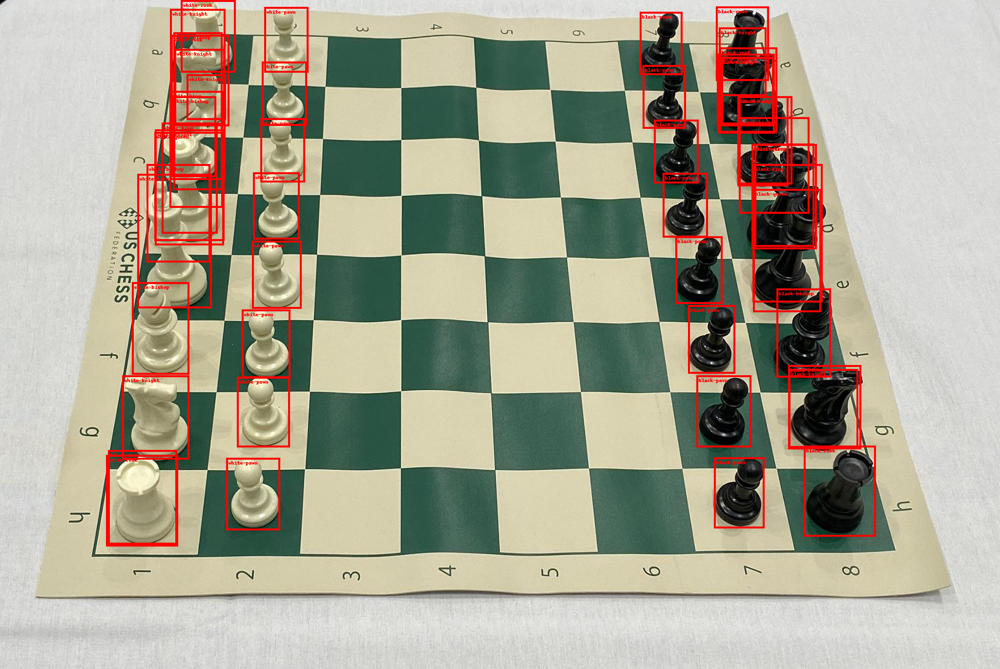

In [28]:
# Inferencja na zadanym obrazie
preprocess = M.FasterRCNN_ResNet50_FPN_Weights.COCO_V1.transforms() # to wystarczy pobrać raz
img = read_image(os.path.join(DATASET_ROOT, 'test/IMG_0159_JPG.rf.1cf4f243b5072d63e492711720df35f7.jpg'))
batch = [preprocess(img).to(DEVICE)]
prediction = model(batch)[0]
# Rysowanie predykcji - wygodny gotowiec
box = draw_bounding_boxes(
  img,
  boxes=prediction['boxes'],
  labels=[chess_train.coco.cats[i.item()]['name'] for i in prediction['labels']],
  colors='red',
  width=4,
)
to_pil_image(box.detach())

---
### Zadanie 1

Zbadaj wpływ parametrów inferencji **głowic `RoIHeads`**, progu prawdopodobieństwa (`score_thresh`) i progu NMS (`nms_thresh`), na działanie modelu. Wykorzystaj funkcję `evaluate` aby zmierzyć zmianę jakości predykcji, ale przebadaj też efekty wizualnie, wyświetlając predykcje dla kilku obrazów ze zbioru walidacyjnego i kilku spoza zbioru (folder `wild`). _W finalnej wersji pozostaw tylko wybrane interesujące przykłady._

In [16]:
from typing import List
from tqdm.auto import tqdm
import matplotlib.pyplot as plt

def load_roiheads_model(model_path: str = "out2/checkpoint.pth", score_thresh: float = 0.05, nms_thresh: float = 0.5):
    """Loads model with roi heads parametrization"""

    model = M.fasterrcnn_resnet50_fpn(
        weights=M.FasterRCNN_ResNet50_FPN_Weights.COCO_V1, 
        num_classes=91,        
        box_score_thresh=score_thresh,
        box_nms_thresh=nms_thresh
    ).to(DEVICE)

    model.roi_heads.box_predictor = M.faster_rcnn.FastRCNNPredictor(in_channels=1024, num_classes=NUM_CLASSES).to(DEVICE)
    model.load_state_dict(torch.load(model_path)["model"])
    model.eval()

    return model

def plot_roiheads(image_paths: List[str], score_threshs: List[float], nms_threshs: List[float]):
    """Plot roiheads results"""

    fig, axes = plt.subplots(6, 5, figsize=(30, 35))
    preprocess = M.FasterRCNN_ResNet50_FPN_Weights.COCO_V1.transforms()

    for ax, image_path in tqdm(zip(axes, image_paths), total=len(image_paths)):
        for i, score_thresh in enumerate(score_threshs):
            for j, nms_thresh in enumerate(nms_threshs):

                model = load_roiheads_model(
                    score_thresh=score_thresh, 
                    nms_thresh=nms_thresh
                )

                img = read_image(image_path)
                batch = [preprocess(img).to(DEVICE)]
                prediction = model(batch)[0]

                box = draw_bounding_boxes(
                    img,
                    boxes=prediction['boxes'],
                    labels=[chess_train.coco.cats[i.item()]['name'] for i in prediction['labels']],
                    colors='red',
                    width=4,
                )
                box = to_pil_image(box.detach())
                
                ax[i + j].imshow(box)
                ax[i + j].set_title(f"score_thresh={score_thresh}, nms_thresh={nms_thresh}")
                ax[i + j].axis("off")

def eval_roiheads(score_threshs: List[float], nms_threshs: List[float]):
    """Evaluate roi heads configurations"""

    chess_test = get_dataset(
        os.path.join(DATASET_ROOT, 'test'), 
        os.path.join(DATASET_ROOT, 'test/_annotations.coco.json')
    )

    test_loader = torch.utils.data.DataLoader(
        chess_test, 
        batch_size=1, 
        num_workers=NUM_WORKERS, 
        collate_fn=utils.collate_fn
    )

    for score_thresh in tqdm(score_threshs):
        for nms_thresh in tqdm(nms_threshs, leave=False):
            model = load_roiheads_model(
                score_thresh=score_thresh, 
                nms_thresh=nms_thresh
            )

            evaluator = evaluate(model, test_loader, DEVICE)

#### Score Threshold

Ten próg mówi jak wysoką pewność musi mieć dany proponowany rejon aby został uwzględniony w ostatecznej predykcji.

| Score threshold | AP (all): IoU=0.50:0.95 | AP (all): IoU=0.50 | AP (all): IoU=0.75 | AR (all): maxDets=1 | AR (all): maxDets=10 | AR (all): maxDets=100 |
| ---- | ----- | ----- | ----- | ----- | ----- | ----- |
| 0.01 | 0.335 | 0.435 | 0.418 | 0.335 | 0.495 | 0.495 |
| 0.02 | **0.337** | 0.442 | 0.413 | 0.327 | 0.490 | 0.490 |
| 0.05 | 0.336 | **0.444** | **0.418** | **0.339** | **0.501** | **0.501** |
| 0.10 | 0.265 | 0.345 | 0.333 | 0.265 | 0.418 | 0.418 |
| 0.20 | 0.159 | 0.208 | 0.195 | 0.214 | 0.327 | 0.327 |

Zwracane wartości metryk mają dosyć wysoką wariancję, gdy puszczamy inferencję wielokrotnie. Najlepsze wyniki zarówno dla precision jak i recall dostajemy na domyślnym parametrze $0.05$.


#### NMS Threshold

Ten próg mówi przy jak mocno moga się na siebie nakładać rejony w ostatecznej predykcji (Non-maximum supression).

| NMS threshold | AP (all): IoU=0.50:0.95 | AP (all): IoU=0.50 | AP (all): IoU=0.75 | AR (all): maxDets=1 | AR (all): maxDets=10 | AR (all): maxDets=100 |
| --- | ----- | ----- | ----- | ----- | ----- | ----- |
| 0.05 | 0.171 | 0.219 | 0.211 | 0.220 | 0.335 | 0.335 |
| 0.10 | 0.077 | 0.098 | 0.094 | 0.127 | 0.173 | 0.173 |
| 0.20 | 0.252 | 0.326 | 0.315 | 0.265 | 0.409 | 0.409 |
| 0.50 | **0.390** | **0.500** | **0.484** | **0.361** | **0.544** | **0.544** |
| 1.00 | 0.119 | 0.149 | 0.140 | 0.209 | 0.299 | 0.310 |

Dla NMS metryki są równie nie stabilne w wielu wykonaniach jak w poprzednim teście. Najlepsze wyniki są ponownie osiągane dla domyślnego parametry, tym razem to $0.5$.

In [9]:
images = [
    os.path.join(DATASET_ROOT, "test", "e0d38d159ad3a801d0304d7e275812cc_jpg.rf.fa0bb8160816a373df824349a24a11e7.jpg"),
    os.path.join(DATASET_ROOT, "test", "b9402881fa580d0eb8b9b98845417550_jpg.rf.087d716cdfdd9cf2cb65b437af716d4d.jpg"),
    os.path.join(DATASET_ROOT, "test", "685b860d412b91f5d4f7f9e643b84452_jpg.rf.5ba8dc0b5d2585d01b28089debd42cd6.jpg"),
    os.path.join("wild", "chesscom_fide.jpeg"),
    os.path.join("wild", "chesscom_uscf.jpeg"),
    os.path.join("wild", "shop.jpg")
]

  0%|          | 0/6 [00:00<?, ?it/s]

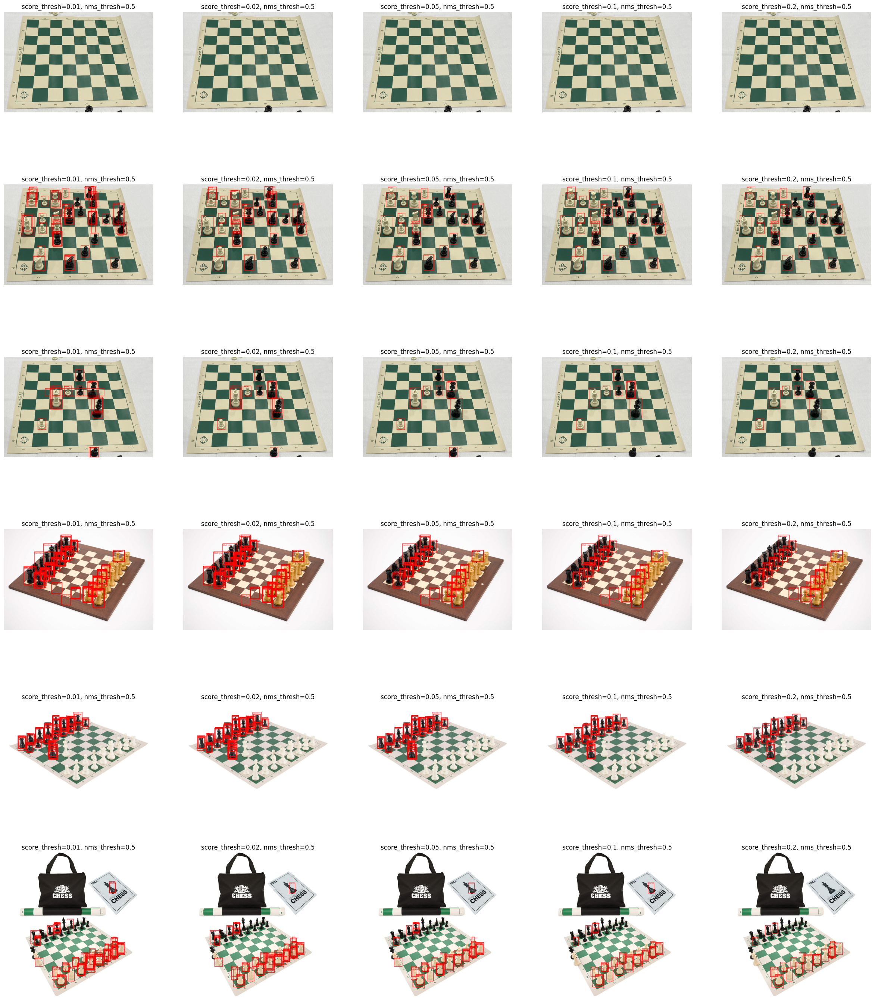

In [17]:
plot_roiheads(images, [0.01, 0.02, 0.05, 0.1, 0.2], [0.5])

Przy zwiększaniu `score_thresh` widzimy, że eliminowane są mniej dokładne predykcje (takie, gdzie bounding box nie zawierał tylko jednego elementu albo zawierał tylko jego część). 

  0%|          | 0/6 [00:00<?, ?it/s]

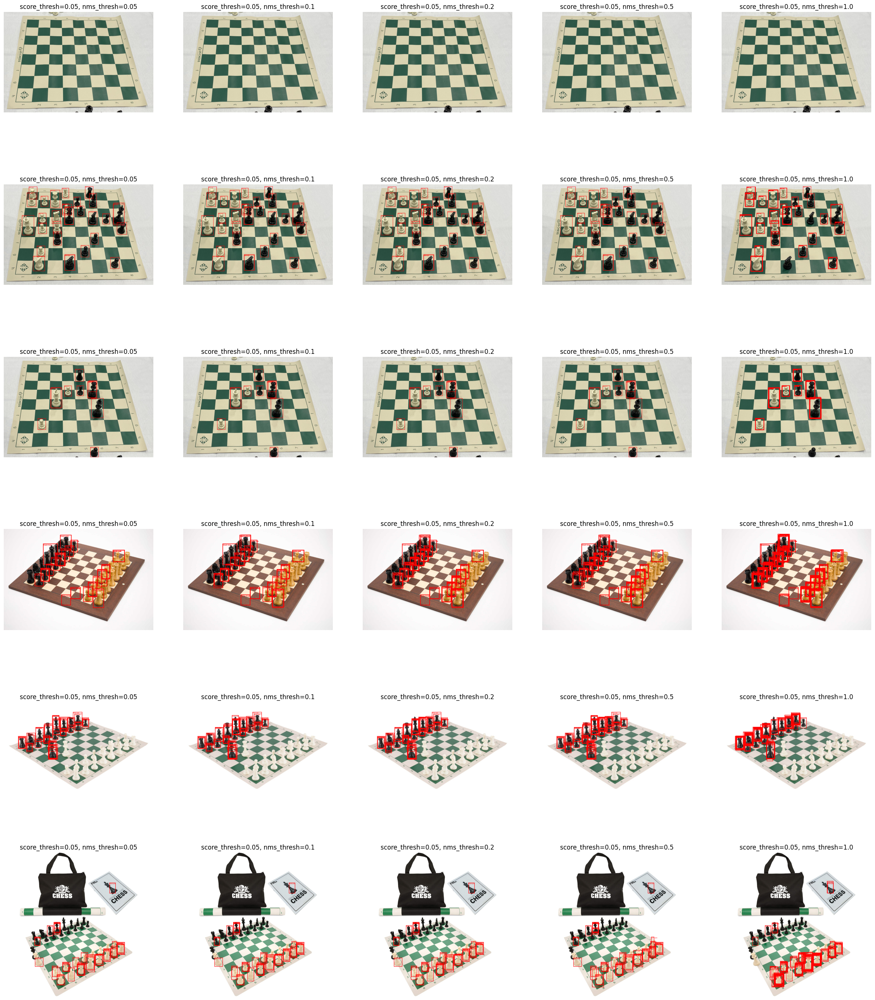

In [18]:
plot_roiheads(images, [0.05], [0.05, 0.1, 0.2, 0.5, 1.0])

Przy zwiększaniu progu `nms_thresh` zauważamy, że przybywa nakładających się bounding boxów, które dokonują detekcję tego samego obiektu. Poprzez zmniejszenie progu zostają tylko te najbardziej dokładne bounding boxy.

### Zadanie 2a

Zwizualizuj propozycje rejonów wygenerowane przez RPN i porównaj z ostateczną predykcją.

W tym celu konieczne będzie manualne wykonanie fragmentu metody `GeneralizedRCNN::forward` (patrz: [kod](https://github.com/pytorch/vision/blob/main/torchvision/models/detection/generalized_rcnn.py#L104)).
Wszystkie fragmenty związane z uczeniem możesz rzecz jasna pominąć; chodzi o wyciągnięcie obiektu `proposals`.
Nie zapomnij o wykonaniu powrotnej transformacji! (Po co?)

In [19]:
from collections import OrderedDict
from typing import Dict, List, Optional, Tuple, Union, Any
import warnings

import torch.nn as nn
from torchvision.models._api import register_model
from torchvision.models._utils import _ovewrite_value_param, handle_legacy_interface
from torchvision.models.detection._utils import overwrite_eps
from torchvision.models.detection.backbone_utils import _mobilenet_extractor, _resnet_fpn_extractor, _validate_trainable_layers
from torchvision.ops import misc as misc_nn_ops
from torchvision.models.resnet import resnet50, ResNet50_Weights

from detection.coco_utils import get_coco_api_from_dataset

class FasterRCNNRPN(M.FasterRCNN):

    def forward_rpn(self, images, targets=None):
        if self.training:
            if targets is None:
                torch._assert(False, "targets should not be none when in training mode")
            else:
                for target in targets:
                    boxes = target["boxes"]
                    if isinstance(boxes, torch.Tensor):
                        torch._assert(
                            len(boxes.shape) == 2 and boxes.shape[-1] == 4,
                            f"Expected target boxes to be a tensor of shape [N, 4], got {boxes.shape}.",
                        )
                    else:
                        torch._assert(False, f"Expected target boxes to be of type Tensor, got {type(boxes)}.")

        original_image_sizes: List[Tuple[int, int]] = []
        for img in images:
            val = img.shape[-2:]
            torch._assert(
                len(val) == 2,
                f"expecting the last two dimensions of the Tensor to be H and W instead got {img.shape[-2:]}",
            )
            original_image_sizes.append((val[0], val[1]))

        images, targets = self.transform(images, targets)

        # Check for degenerate boxes
        # TODO: Move this to a function
        if targets is not None:
            for target_idx, target in enumerate(targets):
                boxes = target["boxes"]
                degenerate_boxes = boxes[:, 2:] <= boxes[:, :2]
                if degenerate_boxes.any():
                    # print the first degenerate box
                    bb_idx = torch.where(degenerate_boxes.any(dim=1))[0][0]
                    degen_bb: List[float] = boxes[bb_idx].tolist()
                    torch._assert(
                        False,
                        "All bounding boxes should have positive height and width."
                        f" Found invalid box {degen_bb} for target at index {target_idx}.",
                    )

        features = self.backbone(images.tensors)
        if isinstance(features, torch.Tensor):
            features = OrderedDict([("0", features)])

        proposals, proposal_losses = self.rpn(images, features, targets)
        detections, detector_losses = self.roi_heads(features, proposals, images.image_sizes, targets)

        proposals = [{"boxes": proposals[0]}]

        proposals = self.transform.postprocess(proposals, images.image_sizes, original_image_sizes) 
        detections = self.transform.postprocess(detections, images.image_sizes, original_image_sizes)  # type: ignore[operator]

        return detections, proposals

    
#@register_model()
@handle_legacy_interface(
    weights=("pretrained", M.FasterRCNN_ResNet50_FPN_Weights.COCO_V1),
    weights_backbone=("pretrained_backbone", ResNet50_Weights.IMAGENET1K_V1),
)
def fasterrcnn_resnet50_fpn_rpn(
    *,
    weights: Optional[M.FasterRCNN_ResNet50_FPN_Weights] = None,
    progress: bool = True,
    num_classes: Optional[int] = None,
    weights_backbone: Optional[ResNet50_Weights] = ResNet50_Weights.IMAGENET1K_V1,
    trainable_backbone_layers: Optional[int] = None,
    **kwargs: Any,
) -> FasterRCNNRPN:
    
    weights = M.FasterRCNN_ResNet50_FPN_Weights.verify(weights)
    weights_backbone = ResNet50_Weights.verify(weights_backbone)

    if weights is not None:
        weights_backbone = None
        num_classes = _ovewrite_value_param("num_classes", num_classes, len(weights.meta["categories"]))
    elif num_classes is None:
        num_classes = 91

    is_trained = weights is not None or weights_backbone is not None
    trainable_backbone_layers = _validate_trainable_layers(is_trained, trainable_backbone_layers, 5, 3)
    norm_layer = misc_nn_ops.FrozenBatchNorm2d if is_trained else nn.BatchNorm2d

    backbone = resnet50(weights=weights_backbone, progress=progress, norm_layer=norm_layer)
    backbone = _resnet_fpn_extractor(backbone, trainable_backbone_layers)
    model = FasterRCNNRPN(backbone, num_classes=num_classes, **kwargs)

    if weights is not None:
        model.load_state_dict(weights.get_state_dict(progress=progress))
        if weights == M.FasterRCNN_ResNet50_FPN_Weights.COCO_V1:
            overwrite_eps(model, 0.0)

    return model

In [25]:
def load_rpn_model(model_path: str = "out2/checkpoint.pth", **kwargs: Any):
    """Loads model with roi heads parametrization"""

    model = fasterrcnn_resnet50_fpn_rpn(
        weights=M.FasterRCNN_ResNet50_FPN_Weights.COCO_V1, 
        num_classes=91,
        **kwargs        
    ).to(DEVICE)

    model.roi_heads.box_predictor = M.faster_rcnn.FastRCNNPredictor(in_channels=1024, num_classes=NUM_CLASSES).to(DEVICE)
    model.load_state_dict(torch.load(model_path)["model"])
    model.eval()

    return model

def plot_rpn(image_paths: List[str]):
    """Plot rpn results"""

    fig, axes = plt.subplots(6, 2, figsize=(30, 60))
    preprocess = M.FasterRCNN_ResNet50_FPN_Weights.COCO_V1.transforms()

    for ax, image_path in tqdm(zip(axes, image_paths), total=len(image_paths)):
        model = load_rpn_model()
        model.eval()

        img = read_image(image_path)
        batch = [preprocess(img).to(DEVICE)]
        detections, proposals = model.forward_rpn(batch)

        detections = detections[0]
        proposals = proposals[0]

        # Proposals boxes
        proposals_box = draw_bounding_boxes(
            img,
            boxes=proposals["boxes"],
            labels=["-" for _ in proposals["boxes"]],
            colors='red',
            width=4,
        )
        proposals_box = to_pil_image(proposals_box.detach())

        # Detections boxes
        detections_box = draw_bounding_boxes(
            img,
            boxes=detections['boxes'],
            labels=[chess_train.coco.cats[i.item()]['name'] for i in detections['labels']],
            colors='red',
            width=4,
        )
        detections_box = to_pil_image(detections_box.detach())
        
        # Plot
        ax[0].set_title("Proposed regions")
        ax[0].imshow(proposals_box)
        ax[0].axis("off")

        ax[1].set_title("Predicted regions")
        ax[1].imshow(detections_box)
        ax[1].axis("off")

  0%|          | 0/6 [00:00<?, ?it/s]

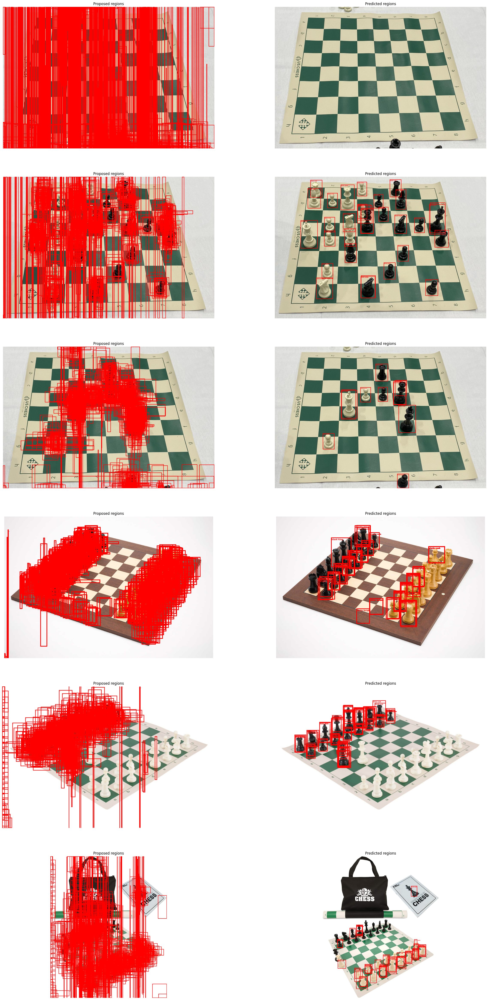

In [21]:
plot_rpn(images)

Dla każdego zdjęcia używany model zwraca $1000$ propozycji bounding boxów. Jak widzimy, większość z nich nie jest dobrymi rejonami. Widzimy dużo podłużnych lub bardzo małych bounding boxów. Predykowane regiony są już jednak dosyć dobrej jakości, ewidentnie widać, że ów niepoprawne rejony dostają niską pewność przez co są dobrze odfiltrowywane przy użyciu `score_thresh`.

### Zadanie 2b

Zbadaj wpływ progu NMS _na etapie propozycji_ na jakość predykcji oraz czas ich uzyskania.
Jak w poprzednich zadaniach, postaraj się nie ograniczyć tylko do pokazania metryk, ale pokaż wizualizacje (propozycji i predykcji) dla wybranych przykładów.

In [37]:
def plot_rpn_nms(image_path: str, nms_threshs: List[float]):
    """Plot rpn nms results"""

    fig, axes = plt.subplots(2, 5, figsize=(30, 10))
    preprocess = M.FasterRCNN_ResNet50_FPN_Weights.COCO_V1.transforms()

    for ax, nms_thresh in tqdm(zip(axes.T, nms_threshs), total=len(nms_threshs)):
        model = load_rpn_model(rpn_nms_thresh=nms_thresh)
        model.eval()

        img = read_image(image_path)
        batch = [preprocess(img).to(DEVICE)]

        start = time.time()
        detections, proposals = model.forward_rpn(batch)
        dt = time.time() - start

        detections = detections[0]
        proposals = proposals[0]

        # Proposals boxes
        proposals_box = draw_bounding_boxes(
            img,
            boxes=proposals["boxes"],
            labels=["-" for _ in proposals["boxes"]],
            colors='red',
            width=4,
        )
        proposals_box = to_pil_image(proposals_box.detach())

        # Detections boxes
        detections_box = draw_bounding_boxes(
            img,
            boxes=detections['boxes'],
            labels=[chess_train.coco.cats[i.item()]['name'] for i in detections['labels']],
            colors='red',
            width=4,
        )
        detections_box = to_pil_image(detections_box.detach())
        
        # Plot
        ax[0].set_title(f"nms_thresh={nms_thresh}, dt={dt:2.2f}s\n\nProposed regions: ")
        ax[0].imshow(proposals_box)
        ax[0].axis("off")

        ax[1].set_title("Predicted regions")
        ax[1].imshow(detections_box)
        ax[1].axis("off")


  0%|          | 0/5 [00:00<?, ?it/s]

/home/patryk/anaconda3/envs/amc/lib/python3.10/site-packages/torchvision/utils.py:210: UserWarning: boxes doesn't contain any box. No box was drawn
  warnings.warn("boxes doesn't contain any box. No box was drawn")


  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

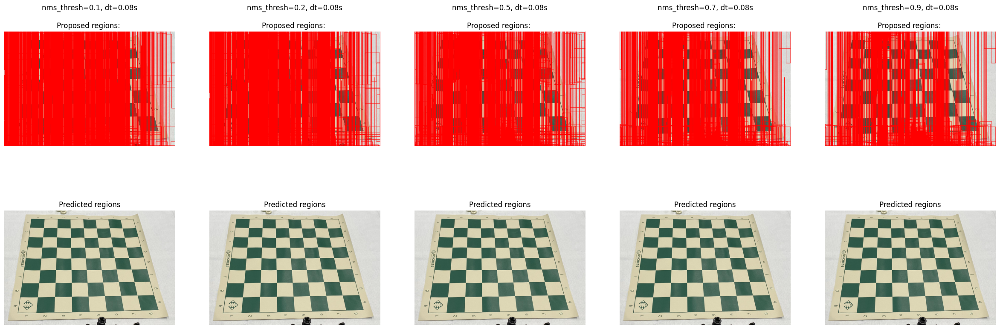

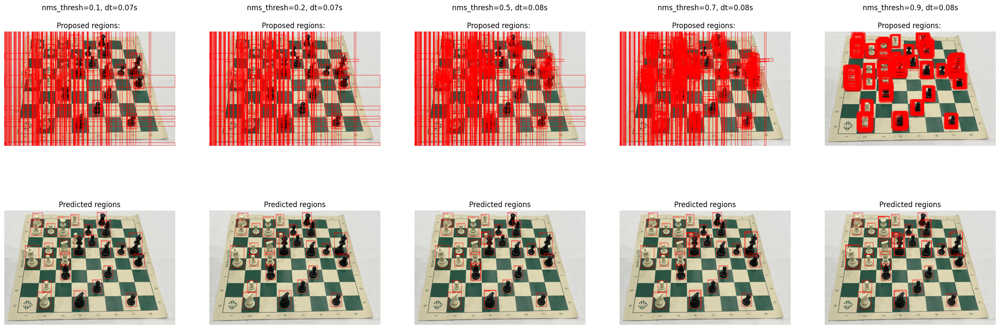

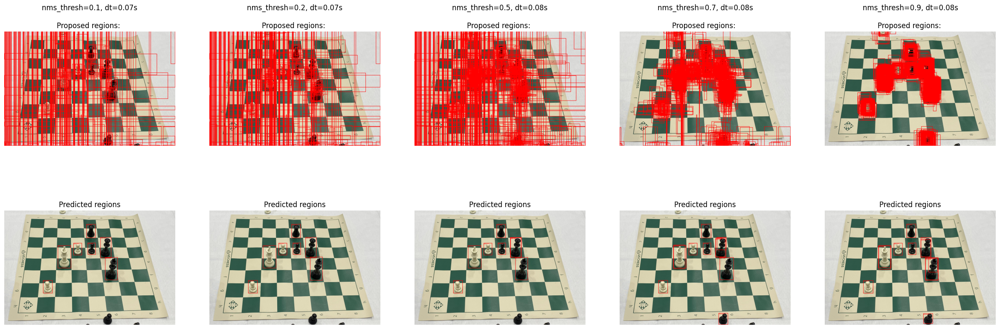

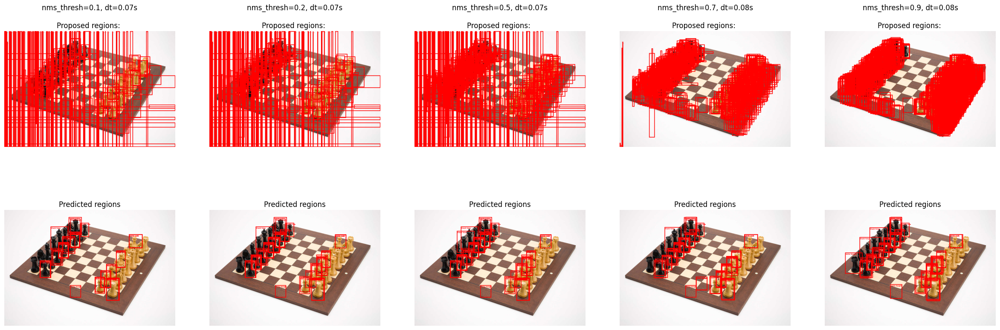

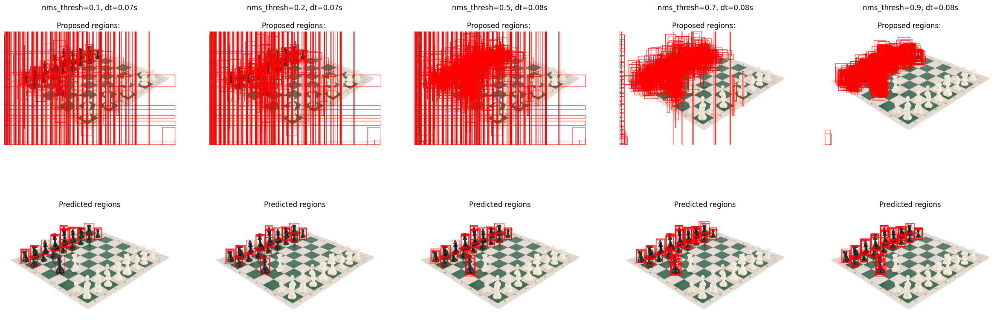

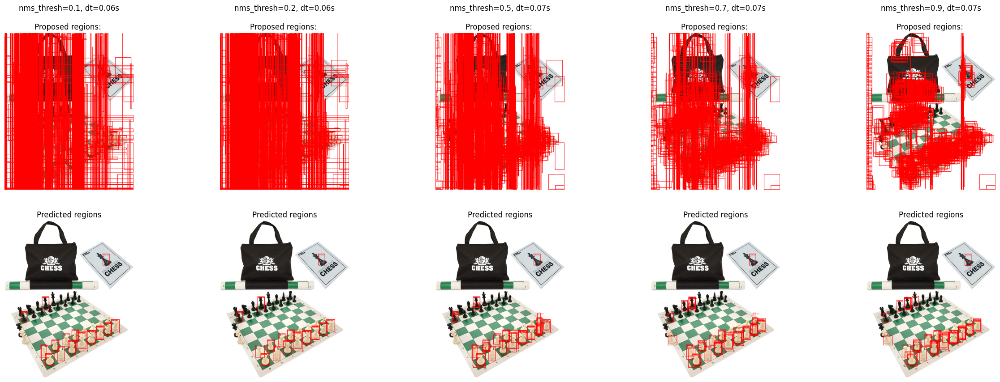

In [39]:
for image in images:
    plot_rpn_nms(image, [0.1, 0.2, 0.5, 0.7, 0.9])

Analizując wpływ `nms_thresh` w module `RPN`, widzimy, że przy zwiększaniu progu proponowane rejony dużo bardziej się nakładają. Gdy próg jest mały, wymuszamy aby rejony nie nakładały się zbytnio na siebie co skutkuje dużą ilością zdegenerowanych pionowych lub poziomych bounding boxów, które nie zawieają w sobie żadnych istotnych elmentów, na których wykryciu nam zależy. Większy progi zdają się dawać lepsze wyniki detekcji na testowanych danych. Czas zdaje się być w miarę podobny niezależnie od progu - obserwujemy minimalny wzrost o $0.01$s dla wyższych progów.